In [1]:
import pandas as pd
import numpy as np
import cv2 
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
from bs4 import BeautifulSoup
from sklearn.model_selection import train_test_split
import shutil

In [2]:
directory = 'annotations'
annotations = os.listdir(directory)

In [3]:
records = []
for annot_file in annotations:

    if annot_file == '.ipynb_checkpoints':
        continue
    
    with open(os.path.join('annotations', annot_file), 'r') as f:
        file = f.read()
    data = BeautifulSoup(file, "xml")
    
    objects = data.find_all('object')
    length = len(objects)
    filename = data.find("filename").text
    img_width = int(data.find('size').width.text)
    img_height = int(data.find('size').height.text)
    
    for i in range(length):
        class_name = data.find_all('object')[i].find('name').text
        xmin = int(data.find_all('object')[i].find('bndbox').find('xmin').text)/img_width
        ymin = int(data.find_all('object')[i].find('bndbox').find('ymin').text)/img_height
        w = int(data.find_all('object')[i].find('bndbox').find('xmax').text)/img_width - xmin
        h = int(data.find_all('object')[i].find('bndbox').find('ymax').text)/img_height - ymin

        xcen = xmin + w * 0.5
        ycen = ymin + h * 0.5
        
        records.append([filename,class_name,xcen,ycen,w,h])

In [4]:
df = pd.DataFrame(records,columns=['filename','class','xcen','ycen','width','height'])
df.drop_duplicates(subset=['filename'],inplace=True)
df['class'] = df['class'].apply(lambda x: 1.0 if x=='dog' else 0.0)
df

,filename,class,xcen,ycen,width,height
0,Cats_Test0.png,0.0,0.600858,0.244286,0.489270,0.322857
1,Cats_Test1.png,1.0,0.368000,0.244000,0.224000,0.400000
2,Cats_Test10.png,1.0,0.421000,0.229333,0.214000,0.160000
3,Cats_Test100.png,0.0,0.348000,0.472000,0.128000,0.170667
4,Cats_Test1000.png,0.0,0.485075,0.326000,0.755224,0.596000
...,...,...,...,...,...,...
3682,Cats_Test995.png,1.0,0.277000,0.240000,0.162000,0.234667
3683,Cats_Test996.png,0.0,0.833000,0.279104,0.166000,0.241791
3684,Cats_Test997.png,0.0,0.502000,0.450450,0.236000,0.372372
3685,Cats_Test998.png,0.0,0.536000,0.202000,0.298667,0.256000


In [5]:
df['class'].value_counts()

class
1.0    2498
0.0    1188
Name: count, dtype: int64

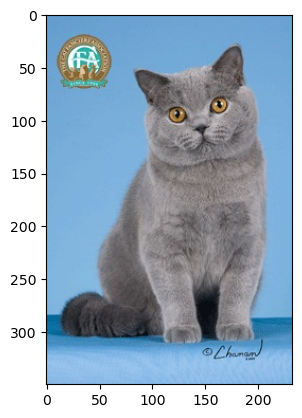

In [6]:
img = cv2.imread('data/images/Cats_Test0.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

In [7]:
img.shape

(350, 233, 3)

In [8]:
img = cv2.rectangle(img, (int((df.iloc[0]['xcen'] - df.iloc[0]['width'] * 0.5) * 233), int((df.iloc[0]['ycen'] - df.iloc[0]['height'] * 0.5) * 350)), 
                    (int((df.iloc[0]['xcen'] + df.iloc[0]['width'] * 0.5) * 233), int((df.iloc[0]['ycen'] + df.iloc[0]['height'] * 0.5) * 350)),
                    (0, 255, 0),
                    2)

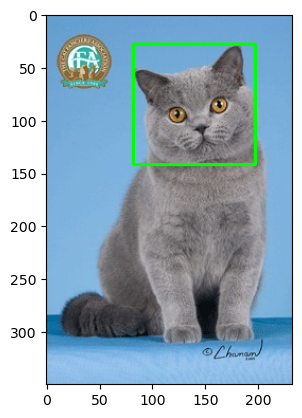

In [9]:
plt.imshow(img)

In [9]:
os.mkdir('C:\\Users\\user\\Anaconda\\CV pet project\\data\\images\\train')

In [11]:
os.mkdir('C:\\Users\\user\\Anaconda\\CV pet project\\data\\images\\val')

In [12]:
os.mkdir('C:\\Users\\user\\Anaconda\\CV pet project\\data\\labels\\train')
os.mkdir('C:\\Users\\user\\Anaconda\\CV pet project\\data\\labels\\val')

In [ ]:
for row in df.transpose():
    with open(f'C:\\Users\\user\\Anaconda\\CV pet project\\data\\labels\\' + df.iloc[row].filename.replace('.png', '.txt'), 'w') as f:
        f.write(f'{int(df.iloc[row]['class'])} {df.iloc[row]['xcen']} {df.iloc[row]['ycen']} {df.iloc[row]['width']} {df.iloc[row]['height']}')

In [6]:
train_df, test_df = train_test_split(df, test_size=0.4, random_state=42)

In [16]:
for img in train_df['filename']:
    shutil.move('C:\\Users\\user\\Anaconda\\CV pet project\\data\\images\\' + img, 'C:\\Users\\user\\Anaconda\\CV pet project\\data\\images\\train')
    

In [17]:
for img in test_df['filename']:
    shutil.move('C:\\Users\\user\\Anaconda\\CV pet project\\data\\images\\' + img, 'C:\\Users\\user\\Anaconda\\CV pet project\\data\\images\\val')
    

In [18]:
for file in train_df['filename']:
    shutil.move('C:\\Users\\user\\Anaconda\\CV pet project\\data\\labels\\' + file.replace('.png', '.txt'),
                'C:\\Users\\user\\Anaconda\\CV pet project\\data\\labels\\train')

In [19]:
for file in test_df['filename']:
    shutil.move('C:\\Users\\user\\Anaconda\\CV pet project\\data\\labels\\' + file.replace('.png', '.txt'),
                'C:\\Users\\user\\Anaconda\\CV pet project\\data\\labels\\val')

In [20]:
from ultralytics import YOLO

In [21]:
# Load a model

model = YOLO("yolov8n.yaml")

# train the model
results = model.train(data='config.yaml', epochs=20)

Ultralytics 8.3.70  Python-3.12.4 torch-2.6.0+cpu CPU (AMD Ryzen 5 5600X 6-Core Processor)
engine\trainer: task=detect, mode=train, model=yolov8n.yaml, data=config.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=Tr

train: Scanning C:\Users\user\Anaconda\CV pet project\data\labels\train... 2211 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2211/2211 [00:02<00:00, 826.41it/s]


train: New cache created: C:\Users\user\Anaconda\CV pet project\data\labels\train.cache


val: Scanning C:\Users\user\Anaconda\CV pet project\data\labels\val... 1475 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1475/1475 [00:01<00:00, 870.96it/s]


val: New cache created: C:\Users\user\Anaconda\CV pet project\data\labels\val.cache
Plotting labels to runs\detect\train5\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train5
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20         0G       2.84      4.135      3.974          8        640: 100%|██████████| 139/139 [07:02<00:00,  3.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:20<00:00,  1.71s/it]

                   all       1475       1475     0.0032       0.44    0.00421    0.00129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20         0G      2.672      3.596        3.3          8        640: 100%|██████████| 139/139 [07:54<00:00,  3.42s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:32<00:00,  1.96s/it]


                   all       1475       1475     0.0994      0.226     0.0724     0.0224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20         0G      2.358       3.01      2.933          3        640: 100%|██████████| 139/139 [07:05<00:00,  3.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:18<00:00,  1.67s/it]


                   all       1475       1475      0.648       0.16      0.139      0.044

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20         0G      2.069      2.624      2.617          6        640: 100%|██████████| 139/139 [06:59<00:00,  3.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:17<00:00,  1.64s/it]

                   all       1475       1475      0.337      0.408      0.313       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20         0G      1.904      2.342      2.409         12        640: 100%|██████████| 139/139 [06:56<00:00,  3.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:16<00:00,  1.62s/it]

                   all       1475       1475      0.297      0.573      0.382      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20         0G      1.771      2.116      2.261          6        640: 100%|██████████| 139/139 [06:56<00:00,  3.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:17<00:00,  1.65s/it]

                   all       1475       1475      0.631      0.479      0.542      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20         0G      1.656      1.999      2.159          4        640: 100%|██████████| 139/139 [06:56<00:00,  3.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:17<00:00,  1.66s/it]

                   all       1475       1475      0.571      0.596        0.6      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20         0G      1.595      1.858      2.088          7        640: 100%|██████████| 139/139 [07:42<00:00,  3.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:29<00:00,  1.90s/it]

                   all       1475       1475      0.613       0.63      0.676      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20         0G       1.52      1.756      2.019          5        640: 100%|██████████| 139/139 [07:56<00:00,  3.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:18<00:00,  1.67s/it]

                   all       1475       1475      0.713      0.712       0.77      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20         0G      1.482       1.67      1.979          5        640: 100%|██████████| 139/139 [07:01<00:00,  3.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:17<00:00,  1.65s/it]

                   all       1475       1475      0.718      0.719      0.784      0.521


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20         0G      1.272      1.334      1.808          3        640: 100%|██████████| 139/139 [06:52<00:00,  2.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:18<00:00,  1.68s/it]

                   all       1475       1475      0.751      0.752      0.826      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20         0G       1.23      1.187       1.76          3        640: 100%|██████████| 139/139 [06:49<00:00,  2.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:16<00:00,  1.63s/it]

                   all       1475       1475      0.802      0.755      0.849       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20         0G      1.167      1.095      1.695          3        640: 100%|██████████| 139/139 [06:48<00:00,  2.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:16<00:00,  1.63s/it]

                   all       1475       1475      0.812      0.794      0.867      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20         0G      1.131      1.041      1.661          3        640: 100%|██████████| 139/139 [06:48<00:00,  2.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:16<00:00,  1.63s/it]

                   all       1475       1475       0.85      0.802      0.889      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20         0G      1.097     0.9734      1.622          3        640: 100%|██████████| 139/139 [06:47<00:00,  2.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:16<00:00,  1.63s/it]

                   all       1475       1475      0.858      0.828      0.906      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20         0G      1.067     0.9338      1.592          3        640: 100%|██████████| 139/139 [06:48<00:00,  2.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:16<00:00,  1.63s/it]

                   all       1475       1475      0.902      0.832      0.928      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20         0G      1.057     0.8995      1.582          3        640: 100%|██████████| 139/139 [06:48<00:00,  2.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:15<00:00,  1.61s/it]

                   all       1475       1475      0.899      0.835      0.928      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20         0G     0.9988     0.8342      1.526          3        640: 100%|██████████| 139/139 [06:47<00:00,  2.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:17<00:00,  1.64s/it]

                   all       1475       1475      0.886      0.855      0.937      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20         0G     0.9638     0.8139      1.494          3        640: 100%|██████████| 139/139 [06:48<00:00,  2.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:16<00:00,  1.63s/it]

                   all       1475       1475      0.922      0.865      0.951      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20         0G     0.9617     0.8185      1.491          3        640: 100%|██████████| 139/139 [06:47<00:00,  2.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:16<00:00,  1.63s/it]

                   all       1475       1475      0.925      0.866      0.952      0.728



20 epochs completed in 2.784 hours.
Optimizer stripped from runs\detect\train5\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\train5\weights\best.pt, 6.2MB

Validating runs\detect\train5\weights\best.pt...
Ultralytics 8.3.70  Python-3.12.4 torch-2.6.0+cpu CPU (AMD Ryzen 5 5600X 6-Core Processor)
YOLOv8n summary (fused): 168 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [01:06<00:00,  1.41s/it]


                   all       1475       1475      0.925      0.866      0.952      0.728
                   cat        483        483      0.927      0.872      0.959      0.792
                   dog        992        992      0.922       0.86      0.945      0.664
Speed: 1.1ms preprocess, 38.5ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs\detect\train5


In [11]:
res = plt.imread('runs/detect/train5/results.png')

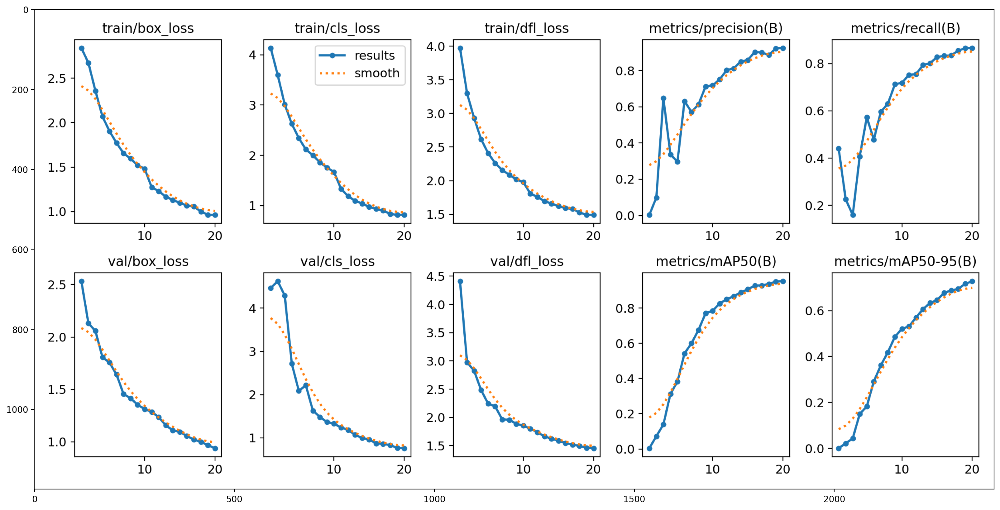

In [17]:
plt.figure(figsize=(20,10), dpi=200)
plt.imshow(res)

In [21]:
val_target0 = plt.imread('runs/detect/train5/val_batch0_labels.jpg')
val_pred0 = plt.imread('runs/detect/train5/val_batch0_pred.jpg')

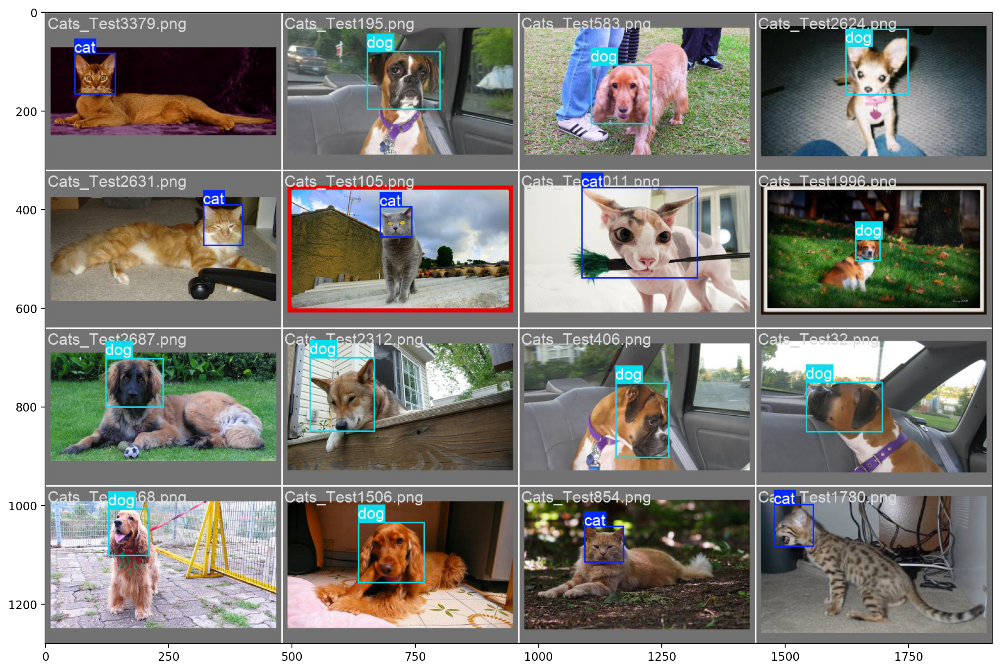

In [23]:
plt.figure(figsize=(20,10), dpi=200)
plt.imshow(val_target0);

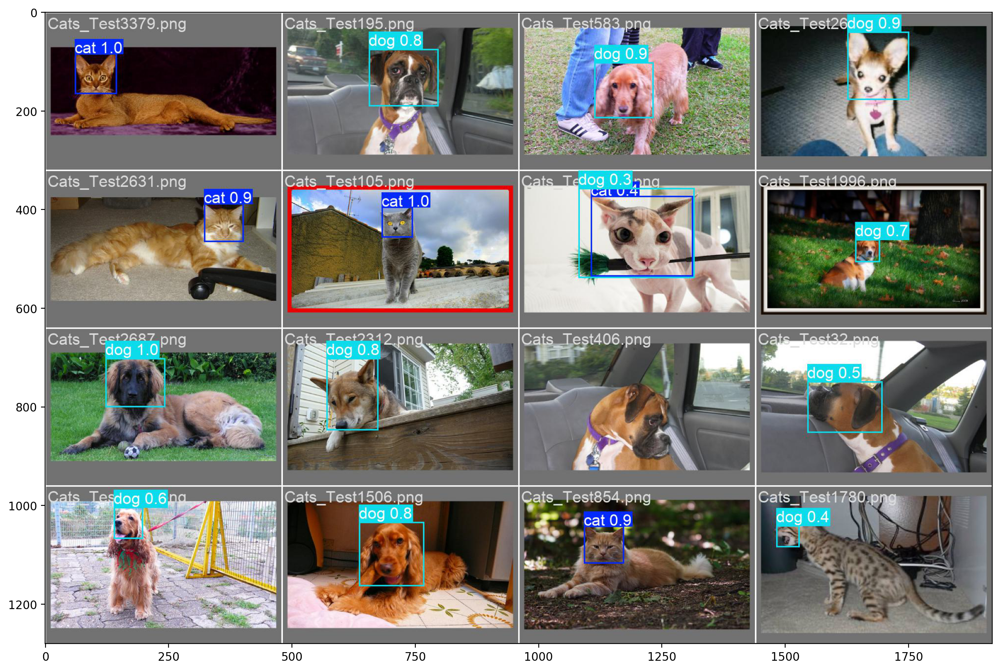

In [25]:
plt.figure(figsize=(20,10), dpi=200)
plt.imshow(val_pred0);